## Imports

In [ ]:
import os
import sys
import cv2
import random
import math
import json
import re
import time
import numpy as np
import tensorflow as tf
from PIL import Image
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.image as mpimg
%matplotlib inline
from google.colab import drive
drive.mount('/content/drive')
ROOT_DIR = os.path.abspath("/content/drive/My Drive/TCC")
MODA_DIR = os.path.join(ROOT_DIR, 'modanet/modanet/annotations/')
MODA_SEG_DIR = os.path.join(ROOT_DIR, 'Visualização/mascaras/test')
CUSTOM_DIR = os.path.join('/content/drive/My Drive/UFRN/FASHION/')
weights_path = os.path.join(ROOT_DIR, 'Train/logs/modanet20190918T1212/mask_rcnn_modanet_0029.h5')
MODEL_DIR = os.path.join(ROOT_DIR, "Train/logs/inspect")
RCNN_DIR = os.path.join(ROOT_DIR, "Mask_RCNN-master")
sys.path.append(RCNN_DIR)  
from mrcnn.config import Config
from mrcnn import utils
from mrcnn import visualize
from mrcnn.visualize import display_images
import mrcnn.model as modellib
from mrcnn.model import log

## Functions

In [ ]:
def get_ax(rows=1, cols=1, size=16):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Adjust the size attribute to control how big to render images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax


def plot_figures(figures, nrows = 1, ncols=1):
    """Plot a dictionary of figures.

    Parameters
    ----------
    figures : <title, figure> dictionary
    ncols : number of columns of subplots wanted in the display
    nrows : number of rows of subplots wanted in the figure
    """
    fig, axeslist = plt.subplots(ncols=ncols, nrows=nrows)
    for ind,title in zip(range(len(figures)), figures):
        axeslist.ravel()[ind].imshow(figures[title], cmap=plt.jet())
        axeslist.ravel()[ind].set_axis_off()
    plt.tight_layout() # optional


def make_segmentation_mask(image, mask,rois):
        img = image.copy()
        img[:,:,0] *= mask
        img[:,:,1] *= mask
        img[:,:,2] *= mask
        img[img[:,:,:]== 0] = 255
        cropped = img[rois[0]:rois[2],rois[1]:rois[3]]
        return  cropped

## Config Mask R-CNN

In [ ]:
class modanetConfig(Config):
    """Configuration based on the one used for training, here the config is only
    to use the pre-treined model.
    """
    NAME = "modanet"
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    NUM_CLASSES = 1 + 13  # background + 13 shapes
    IMAGE_MIN_DIM = 400
    IMAGE_MAX_DIM = 1024
    RPN_ANCHOR_SCALES = (16, 32, 64, 128, 256)

In [ ]:
class ModaNetDataset(utils.Dataset):
    """Generates the modanet synthetic dataset. """
    
    def load_moda(self, dataset_dir, subset):
        '''
        Reads the JSON file, extracts the annotations, and iteratively calls the internal add_class 
        and add_image functions to build the dataset.
        
        Args:
          dataset_dir: Root directory of the dataset.
          subset(str): Subset to load: 'train' 'test' or 'val'.
        '''
        self.add_class("moda", 1, "bag")
        self.add_class("moda", 2, "belt")
        self.add_class("moda", 3, "boots")
        self.add_class("moda", 4, "footwear")
        self.add_class("moda", 5, "outer")
        self.add_class("moda", 6, "dress")
        self.add_class("moda", 7, "sunglasses")
        self.add_class("moda", 8, "pants")
        self.add_class("moda", 9, "top")
        self.add_class("moda", 10, "shorts")
        self.add_class("moda", 11, "skirt")
        self.add_class("moda", 12, "headwear")
        self.add_class("moda", 13, "scarftie")

        dataset_dir = os.path.join(dataset_dir, subset)
        jsonall = json.load(open(os.path.join(dataset_dir, "instances.json")))
        values = list(jsonall.values())  
        class_nums = []
        polygons = []
        image_ids = []
        category = []
        polygons_list = []
        same_img = []
        localid=0
        cont_same = 0
        
        for a in values[2]:
            polygons.append(a['segmentation'])
            category.append(a['category_id'])
            if localid != a['image_id']:
                image_ids.append(a['image_id']) 
                localid = a['image_id']
                same_img.append(cont_same)
                cont_same = 1
            else:
                cont_same +=1
                        
        same_img.append(cont_same)
        same_img.pop(0)    #len 5043
        
        for i in range(len(image_ids)):
          path = image_ids[i]          
          image_path = os.path.join(dataset_dir, str(path) + '.jpg')
          for j in range(same_img[i]):
            class_nums.append(category.pop(0))
            polygons_list.append(polygons.pop(0))              

          self.add_image('moda',
                          image_id = path,
                          path = image_path,
                          width = 400,
                          height = 600,
                          polygons = polygons_list,
                          class_list = np.array(class_nums))
          class_nums=[]
          polygons_list=[]

          
    def load_mask(self, image_id):
        """Generate instance masks for an image for every object in the image
           by drawing the polygons.

           Returns:
               masks: A bool array of shape [height, width, instance count] with
                      one mask per instance.
               class_ids: a 1D array of class IDs of the instance masks.
        """
        class_ids = []
        polyx = []
        polyy = []
        polygon=[]
        x=[]
        y=[]
        cont = 0
        cont2 = 0
        cont3 = 0
        info = self.image_info[image_id]
        
        for value in info["polygons"]: 
          if(len(value)<2):
            for number in value:
              for item in number:
                if cont%2 == 0:
                  x.append(item)
                else:
                  y.append(item)
                cont +=1
            polyx.append(x)
            x=[]
            polyy.append(y)
            y=[]
          else:
            for valor in value[0]:
              if cont2%2 == 0:
                x.append(valor)
              else:
                y.append(valor)
              cont2+=1
              
            for valor2 in value[1]:
              if cont3%2 == 0:
                x.append(valor2)
              else:
                y.append(valor2)
              cont3+=1
            polyx.append(x)
            x=[]
            polyy.append(y)
            y=[]
        
        mask = np.zeros([info["height"], info["width"], len(polyx)], dtype=np.uint8)
        
        for i, p in enumerate(polyx):
          rr, cc = skimage.draw.polygon(polyy[i], polyx[i]) 
          mask[rr, cc, i] = 1
        
        class_array = info['class_list']

        return mask.astype(np.bool), class_array
      
    def image_reference(self, image_id):
        """
        Return the path of the image: a string that identifies the image
        for debugging purposes
        """
        info = self.image_info[image_id]
        if info["source"] == "moda":
            return info["path"]
        else:
            super(self.__class__, self).image_reference(image_id)     

In [ ]:
config = modanetConfig()

class InferenceConfig(config.__class__):
    NAME = "fashion"
    DETECTION_MIN_CONFIDENCE = 0.8

config = InferenceConfig()
#config.display()

## Run Mask R-CNN

### Load Model and Test

In [ ]:
dataset = ModaNetDataset()
dataset.load_moda(MODA_DIR, "test")
dataset.prepare()
#print("Images: {}\nClasses: {}".format(len(dataset.image_ids), dataset.class_names))

In [ ]:
model = modellib.MaskRCNN(mode="inference",
                          model_dir = MODEL_DIR,
                          config = config)
model.load_weights(weights_path, by_name=True)








Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Instructions for updating:
box_ind is deprecated, use box_indices instead


Instructions for updating:
Use `tf.cast` instead.






Re-starting from epoch 29


### Run detection

4
4
image ID: moda.326527 (1128) /content/drive/My Drive/TCC/modanet/modanet/annotations/test/326527.jpg
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 26)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.08847  max:    1.02591  float32


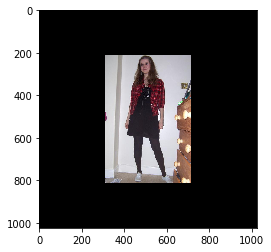

gt_class_id              shape: (4,)                  min:    4.00000  max:    9.00000  int64
gt_bbox                  shape: (4, 4)                min:  308.00000  max:  811.00000  int32
gt_mask                  shape: (1024, 1024, 4)       min:    0.00000  max:    1.00000  bool


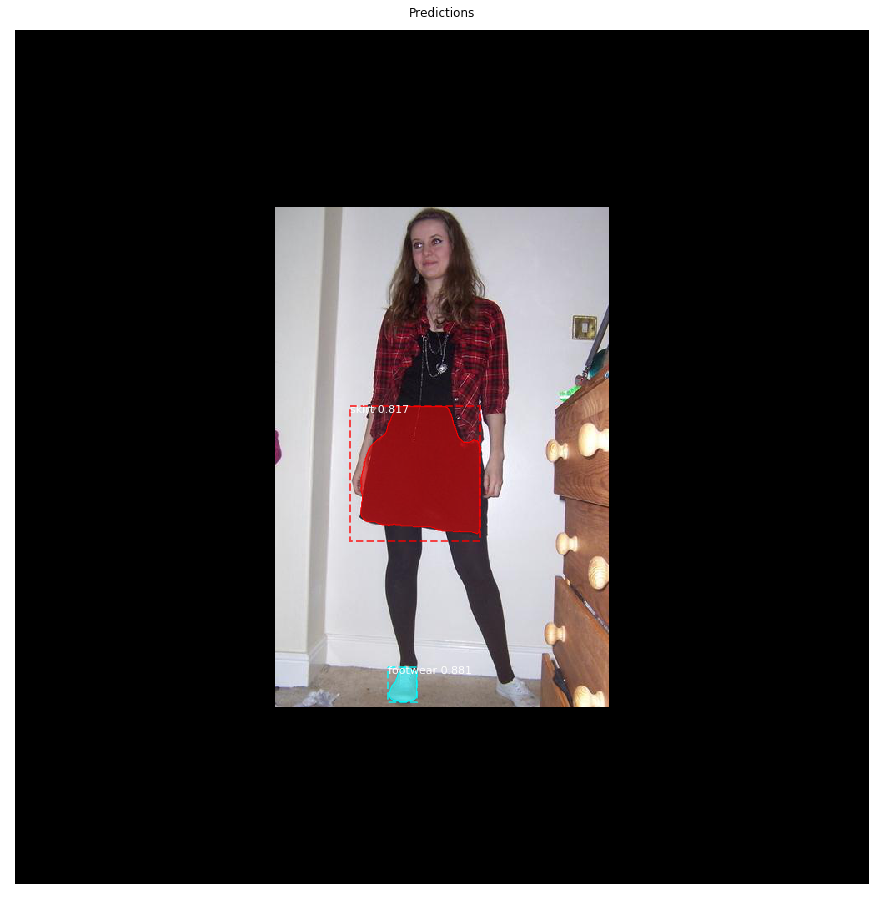

In [ ]:
'''
import skimage.draw

image_id = random.choice(dataset.image_ids)

image, image_meta, gt_class_id, gt_bbox, gt_mask = modellib.load_image_gt(dataset,
                                                                          config,
                                                                          image_id,
                                                                          use_mini_mask=False)
info = dataset.image_info[image_id]

print("image ID: {}.{} ({}) {}".format(info["source"],
                                       info["id"],
                                       image_id,
                                       dataset.image_reference(image_id)))

#img_list = ['127.jpg']
#for img in img_list:
MODA_DIR = os.path.join(ROOT_DIR, 'modanet/modanet/annotations/test')
num_img = 5
cont = 0
for img in os.listdir(MODA_DIR):    
    image = mpimg.imread(os.path.join(MODA_DIR, str(img)))


# Run object detection
results = model.detect([image[:,:,:3]], verbose=1)

# Display results
plt.imshow(image)
plt.show()
ax = get_ax(1)
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], dataset.class_names, r['scores'], ax=ax, title="Predictions")

log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)
#cont +=1
#Limita Leitura
#if cont>num_img:break
'''

### Create Masks

Processing 1 images
image                    shape: (4098, 2732, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 26)               min:    0.00000  max: 4098.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.17695  max:    1.11439  float32
0
1
2
3
4
5
Processing 1 images
image                    shape: (4098, 2732, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 26)               min:    0.00000  max: 4098.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.17695  max:    1.11439  float32
0
1
2
3
Processing 1 images
image                    shape: (4098, 2732, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -12

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


0
1
2
3


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """


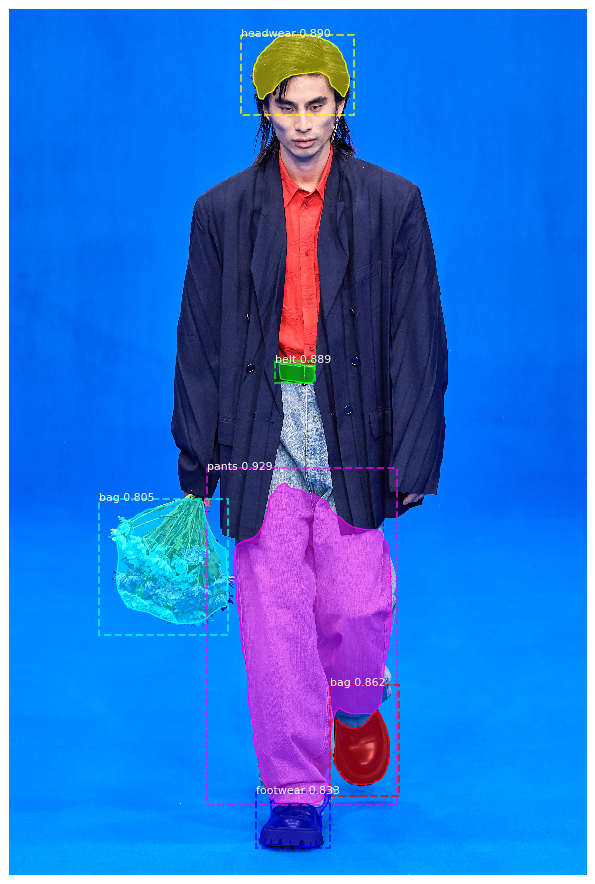

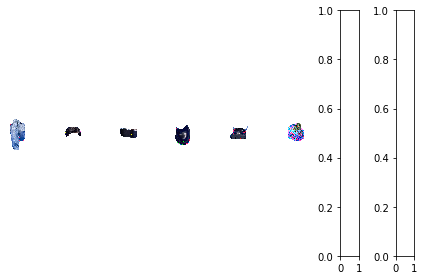

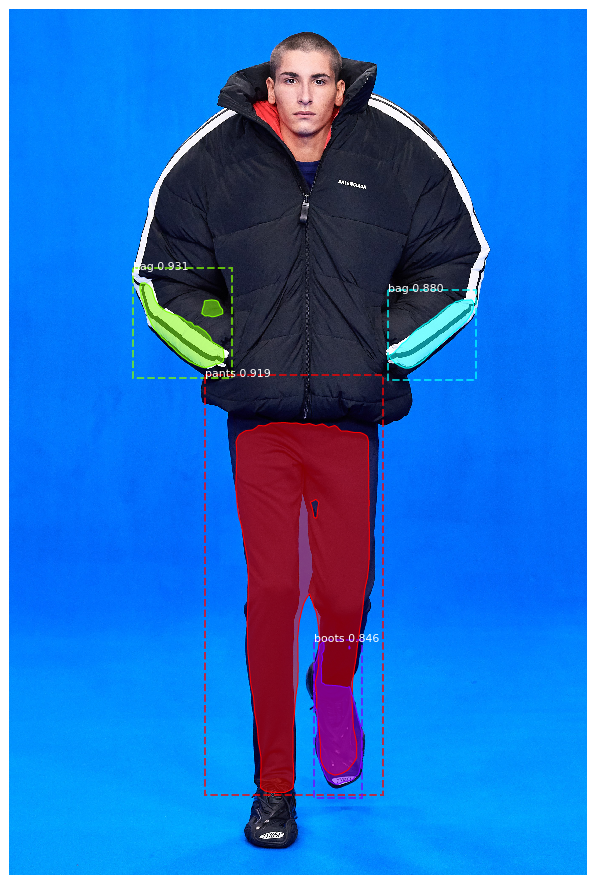

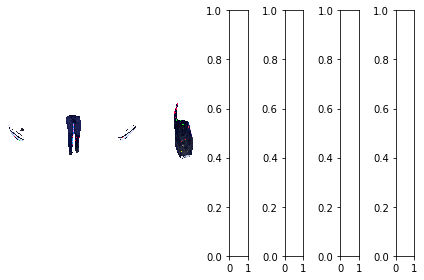

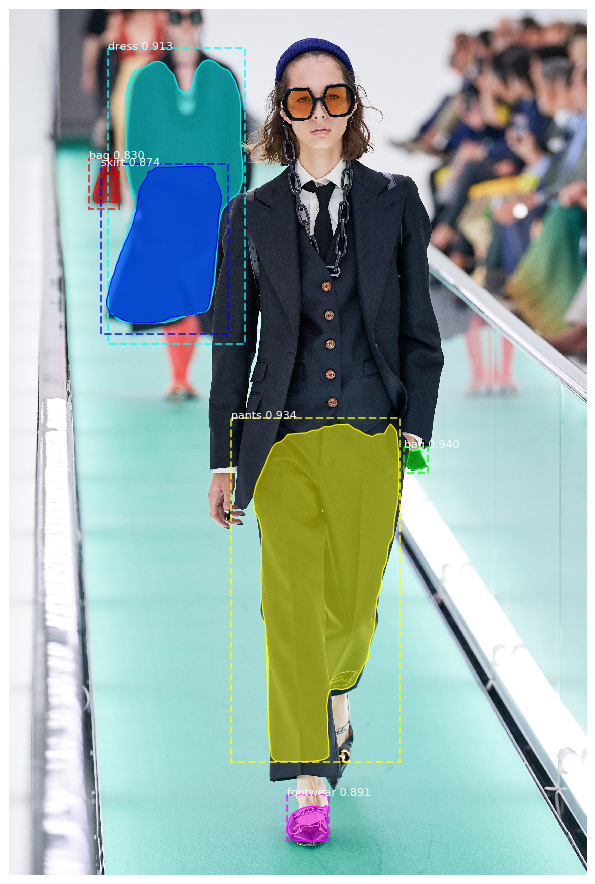

...

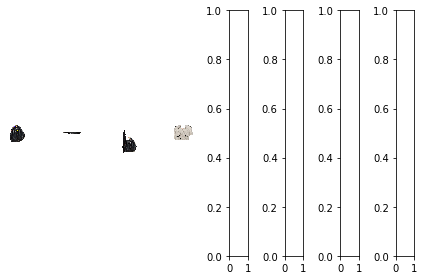

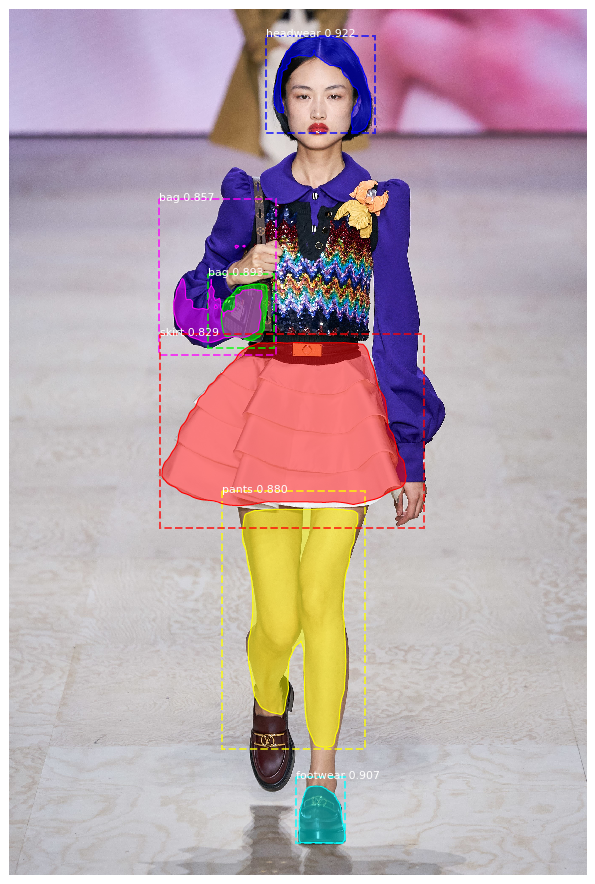

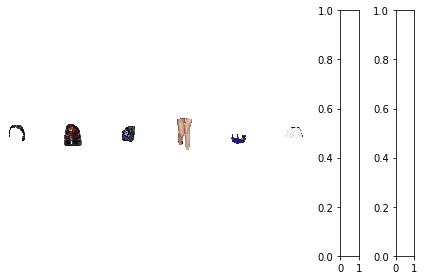

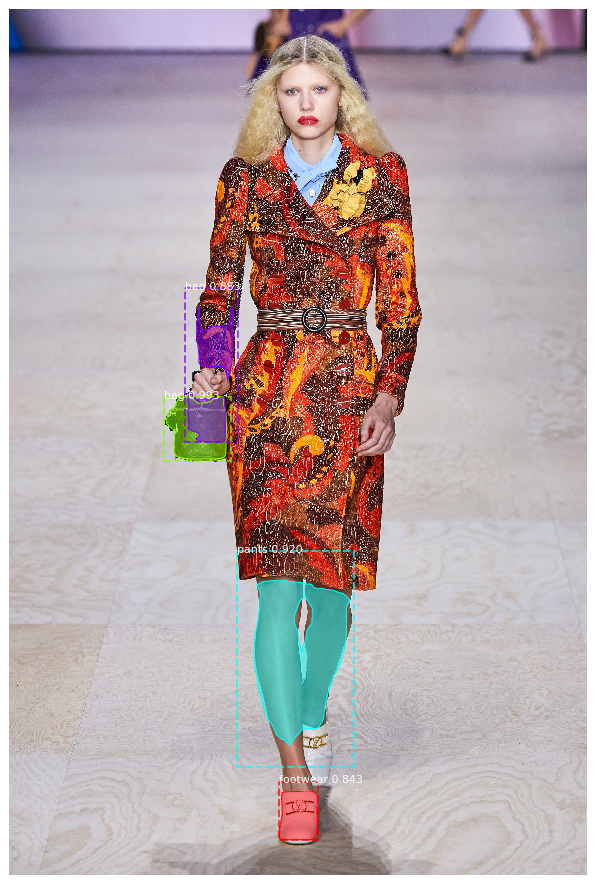

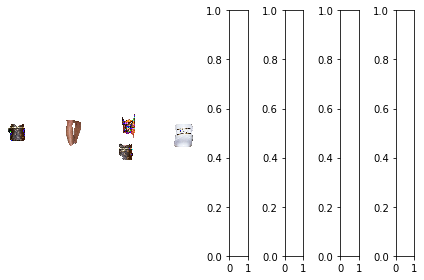

In [ ]:
FASHION_TEST = os.path.join(ROOT_DIR, "fashion/")
img_list = ['_FIO0355.jpg', '_FIO0727.jpg', '_GUC0026.jpg', '_GUC0053.jpg', '00017_FIO0276.jpg', '00051_FIO0755.jpg', '_FIO0580.jpg','_FIO0162.jpg', '_ALE0159 (1).jpg', '_ALE0067.jpg', '_ALE0208.jpg']
#img_list = np.random.choice(dataset.image_ids, 200)    
for img in img_list:
#for img in os.listdir(FASHION_TEST):
    #image = mpimg.imread(os.path.join(FASHION_TEST, str(img)))
    #n = dataset.image_reference(img)   
    #image = mpimg.imread(str(n))
    image = mpimg.imread('/content/drive/My Drive/TCC/fashion/'+str(img))
    # Run object detection
    results = model.detect([image], verbose=1)
    # Display results
    ax = get_ax(1)
    r = results[0]
    class_ids = r['class_ids']   
    figures ={}
    for i in range(r['masks'].shape[-1]):
        print(i)
        mask = r['masks'][:,:,i]
        croped_roi_image = make_segmentation_mask(image, mask, r['rois'][i])
        figures[i] = croped_roi_image
        mpimg.imsave('/content/drive/My Drive/TCC/Visualização/mascaras/moda/'+str(class_ids[i])+'/'+str(img)+'.jpg', figures[i])

    plot_figures(figures, 1, 8)
    
    visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                                dataset.class_names, r['scores'], ax=ax, title="")